# BU.520.710.51.SP19 Big Data Machine Learning

## Group Project: Exploring the potential of Machine Learning in Insurance Claims Severity

## Data Set: UK Traffic Accidents 2015

### Lok Tin Kevin Chan

Historically, accidents insurance plans and payments are calculated using actuarial models. Now with the boom of data collection in insurance industry, we should be able to leverage machine learning to assist with the insurance industry. 

The following project explores a potential usage of machine learning in the insurance industry: 

**To predict the accident severity of a car accident**

Using this prediction results, we can help insurance companies to:

1.	Evaluate insurance claims payment
2.	Evaluate the underwriting of insurance plan 
3.	Insurance claim fraud prediction/investigation

The target variable is thus accident severity which comes in 3 level: 

1.	Slight
2.	Serious
3.	Fatal

Thus we are dealing with a *multi-class classification* problem/analysis. 

The original dataset contains accident information from 2005 to 2014, but since conducting classification analysis with time series becomes quite complex and due to the amount of data, we decided just to analysis accident information that occurred in the Great Britain in 2005. 

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas_profiling
import seaborn as sns
import datetime as dt
import operator

import plotly
import plotly.graph_objs as go
import plotly.io as pio
import plotly.plotly as py
scl = [[0,'#5D56D3'], [0.5,'#7CD96E'], [1,'#CC655B']]

import warnings

from plotly.offline import iplot, init_notebook_mode
from IPython.display import Image

from sklearn.base import BaseEstimator, clone
from sklearn.base import ClassifierMixin
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.externals import six
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.metrics import roc_curve, auc, confusion_matrix, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, validation_curve, learning_curve
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import _name_estimators
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, label_binarize
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.multiclass import unique_labels

from imblearn.over_sampling import SMOTE

from rfpimp import permutation_importances

warnings.filterwarnings("ignore")
init_notebook_mode(connected=True)

C:\Users\ChanWS\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use(BACKEND)


In [2]:
# Import Dataset 
df = pd.read_excel("Accident_Information (2005)_edited2.xlsx")


### Metadata Information

Accident Index: Index identifier of accidents 

Longitude: longitude coordinates of accident 

Latitude: latitude coordinates of accident

**Accident Severity: The severity of accident (1 – Slight, 2 - Serious, 3 – Fatal)** 

Carriageway Hazard: 
    -	None
    -	Other object on road
    -	Any animal in carriageway
    -	Pedestrian in carriage
    -	Previous accident
    -	Vehicle load on road

Date: The date that accident that occurred in the format DD/MM/YYYY

Day of Week: The day of the week that accident occurred

Did Police officer attend scene of accident? (1 – No, 2 – Yes, 3, Yes with Ambulance)

Junction Control: Was there junction control at the location of accident

Light Conditions: the light condition of accident

Number of Casualties:

Number of Vehicles:

Pedestrian crossing-human control:

Pedestrian crossing physical facilities:

Road Surface Conditions:

Road Type:

Special Conditions at site:

Speed limit:

Urban or Rural Area:

Weather Conditions:



In [3]:
# Data Cleaning
# 
# Replace Errant/Mispelled Values
df["Light_Conditions"].replace(
    "Darkeness: No street lighting",
    "Darkness: No street lighting",
    inplace = True
)

# Drop Blank Rows with Blank Values

df["Carriageway_Hazards"].replace(
    "Data missing or out of range",
    np.nan,
    inplace = True
)

df["Junction_Control"].replace(
    "Data missing or out of range",
    np.nan,
    inplace = True
)

df["Road_Surface_Conditions"].replace(
    "Data missing or out of range",
    np.nan,
    inplace = True
)

df["Special_Conditions_at_Site"].replace(
    "Data missing or out of range",
    np.nan,
    inplace = True
)

df.dropna(axis=0, inplace = True)


# Format Date in Datetime format and add Column for Month, and Hour
df["Date"] = pd.to_datetime(df["Date"], format = "%d/%m/%y")
df["Month"] = df["Date"].dt.month
df["Day"] = df["Date"].dt.day



### Profile Report

From our profile report we are able to see that there are 124,288 usable observations with 25 variables (13 numerical ,10 categorical and 1 Date)

Looking at the correlation table between the variables, other than the obvious latitude and longitude data being highly correlated, there doesn't seem to be much super highly correlated variables that requires additional investigation. 

Diving deeper into the data exploration of our profile report of the dataset. 

Accident Severity
    1. 88% of the data belongs to slight and 11% to serious and 1% to fatal
    2. Highly Skewed Dataset which warrant some concerns for our analysis
    3. Interesting to see that number of casualities and severity though positively corr are not super correlated
    4. Seems to be correlated highest to number of vechiles which we would further explore in data visualization

Urban vs Rural
    1. 71.6% of accident occur in Urban while 28.4 % occur in Rural 
    2. Though from our map analysis later we can see that rural area seem to have more seriour/fatal accidents

Skimming through the report, it seems that a lot of the data are skewed to one variable. This though normal with accidents data shows some concerns for our data analysis. It may be hard to observe any interesting pattern that may help us understand the data due to the skewness of the data.


In [4]:
# Getting an idea of the distribution of the dataset
pandas_profiling.ProfileReport(df)
# Correlation map is at the end of the report

Number of variables,25
Number of observations,126288
Total Missing (%),0.0%
Total size in memory,24.1 MiB
Average record size in memory,200.0 B
Numeric,13
Categorical,10
Boolean,0
Date,1
Text (Unique),0
Rejected,1


## Exploratory Data Analysis

### Geographic Visualization of Accidents in UK

Overlaying the geo-coordinates of accidents with the map, we are able to create a visualization of the location of the accidents. We are able to observe some clustering of accidents in major cities, and that there seems to be more severity of accidents that occur in rural but hard to tell just from map. 

It is interesting to note that there seems to be some accidents that occur in the sea, this may be due to rounding of the geo-location data or mapping data not 100% accurate. But maybe also some accidents occured where the car drove off into the sea, and that why marked as occured not on land. 

In [23]:
data = [dict(type = "scattergeo",
            lon = df["Longitude"],
            lat = df["Latitude"],
            mode = "markers",
            marker = dict(
                 size = 1,
                 opacity = 0.75,
                 reversescale = True,
                 autocolorscale = False,
                 symbol = 'circle',
                 colorscale = scl,
                 color = df['Accident_Severity'],
                 cmax = 3,
                 colorbar=dict(
                     title='Accident Severity')))]

layout = dict(title = "<b>2005 UK Accidents</b>",
              width=1000,
              height=1000,
              geo = dict(scope = 'world',
                         projection=dict(type='eckert4'),
                         lonaxis = dict(showgrid = True,
                                        gridwidth = 0.5,
                                        range= [-6, 2.59],
                                        gridcolor='#000000',
                                        dtick = 5),
                         lataxis = dict(showgrid = True,
                                        gridwidth = 0.5,
                                        range = [49.48, 56],
                                        gridcolor ='#000000',
                                        dtick = 5),
            showland = True,
            landcolor = '#FFFFFF',
            subunitcolor = '#E5E5E5',
            countrycolor = '#000000',
        ))

# create figure
fig = go.Figure()
fig = dict(data=data, layout=layout)

# display plot
plotly.offline.iplot(fig)

# Write Geoplot as image
# img_bytes = pio.to_image(fig, format='png')
# Image(img_bytes)


### Accident Severity by Month

Plotting stacked barplot of accident severity by month, we are able to observe a slight seasonality trend though not super obvious. 

We can observe that winter period shows a higher number of accidents which make sense as snow and reduced visibility can cause accidents to occur more frequently. Though from the graph, it seems that accident severity seems to be quite evenly distributed across the month. 

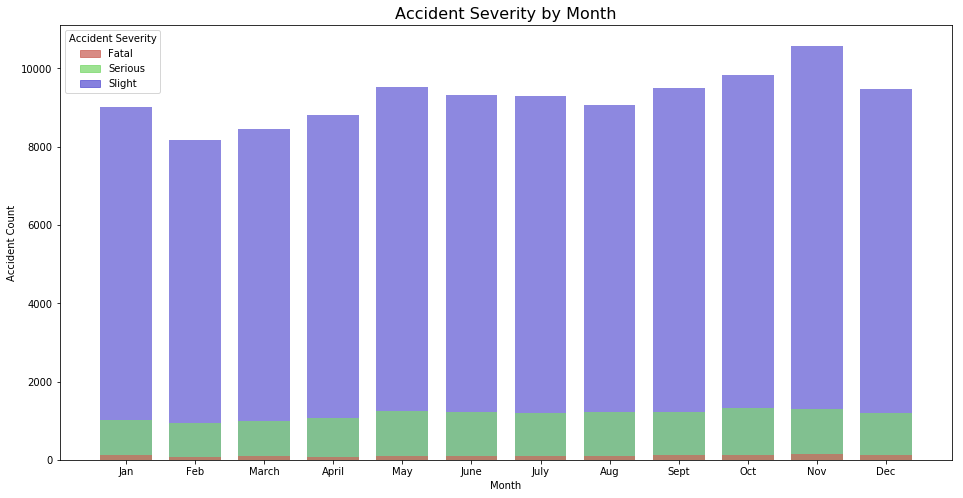

In [21]:
# Set up list of month and length for analysis
month_list = ['Jan', 'Feb', 'March', 'April', 'May', 'June', 
              'July', 'Aug', 'Sept', 'Oct', 'Nov', 
              'Dec']

df_month = df[["Date","Accident_Severity","Accident_Index"]].copy()
df_month.index = df_month["Date"]
df_month["Month"] = df_month.index.month

df_month_1 = pd.DataFrame(df_month[df_month["Accident_Severity"]==1].\
                        groupby('Month').count()["Accident_Index"]).reset_index()

df_month_2 = pd.DataFrame(df_month[df_month["Accident_Severity"]==2].\
                        groupby('Month').count()["Accident_Index"]).reset_index()

df_month_3 = pd.DataFrame(df_month[df_month["Accident_Severity"]==3].\
                        groupby('Month').count()["Accident_Index"]).reset_index()


# Bar plot
plt.rcParams["figure.figsize"] = [16,8]
plt.bar(
    df_month_1["Month"],df_month_1["Accident_Index"], color = "#5D56D3", width = 0.75, alpha = 0.7, align = "center", tick_label = month_list
)
plt.bar(
    df_month_2["Month"],df_month_2["Accident_Index"], color = "#7CD96E", width = 0.75, alpha = 0.7, align = "center", tick_label = month_list
)
plt.bar(
    df_month_3["Month"],df_month_3["Accident_Index"], color = "#CC655B", width = 0.75, alpha = 0.7, align = "center", tick_label = month_list
)

# Format Barplot
plt.title("Accident Severity by Month", size=16)
plt.ylabel("Accident Count")
plt.xlabel("Month")

# Legend
sev1 = mpatches.Patch(color='#CC655B', label='Fatal', alpha=0.75)
sev2 = mpatches.Patch(color='#7CD96E', label='Serious', alpha=0.75)
sev3 = mpatches.Patch(color='#5D56D3', label='Slight', alpha=0.75)
plt.legend(handles=[sev1, sev2, sev3], 
           loc='best', title='Accident Severity')



 ### Traffic Accident Severity by Day of the Week 
 
 Accident tend to occur more frequently in the weekend + Friday; while decreasing from monday to wednesday
 
 Distribution of accident severity tends to follow the trend of the number of accidents (nothing to interesting to note)


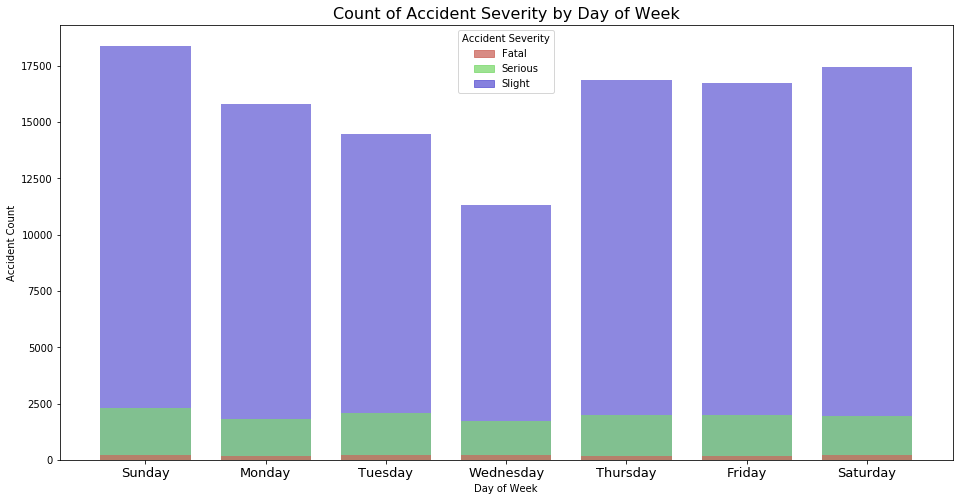

In [52]:
Day_list = ["Mon","Tue","Wed","Thur","Fri","Sat","Sun"]

df_day_1 = df[df["Accident_Severity"]==1].groupby('Day_of_Week').count()["Accident_Index"].to_frame().reset_index()
df_day_2 = df[df["Accident_Severity"]==2].groupby('Day_of_Week').count()["Accident_Index"].to_frame().reset_index()
df_day_3 = df[df["Accident_Severity"]==3].groupby('Day_of_Week').count()["Accident_Index"].to_frame().reset_index()


plt.bar(
    df_day_1["Day_of_Week"],df_day_1["Accident_Index"], color = "#5D56D3", width = 0.75, alpha = 0.7, align = "center")

plt.bar(
    df_day_2["Day_of_Week"],df_day_2["Accident_Index"], color = "#7CD96E", width = 0.75, alpha = 0.7, align = "center")

plt.bar(
    df_day_3["Day_of_Week"],df_day_3["Accident_Index"], color = "#CC655B", width = 0.75, alpha = 0.7, align = "center")

# Format Barplot
plt.xticks(np.arange(0,7,1), ('Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'), fontsize=13)
plt.title("Count of Accident Severity by Day of Week", size=16)
plt.ylabel("Accident Count")
plt.xlabel("Day of Week")
sev1 = mpatches.Patch(color='#CC655B', label='Fatal', alpha=0.75)
sev2 = mpatches.Patch(color='#7CD96E', label='Serious', alpha=0.75)
sev3 = mpatches.Patch(color='#5D56D3', label='Slight', alpha=0.75)
plt.legend(handles=[sev1, sev2, sev3], 
           loc='best', title='Accident Severity')


 ### Rural vs Urban Traffic Accident Casualities and Severity
 
 It is interesting to observe that there seems to be an different in city type and accident severity. As from the below scatter plot, we are able to see that on Urban cluster tend to have a lower average severity and lower number of casualities. While on the other hand rural area tend to have a more seperated cluster, where we see an increasing trend of severity and casualities!

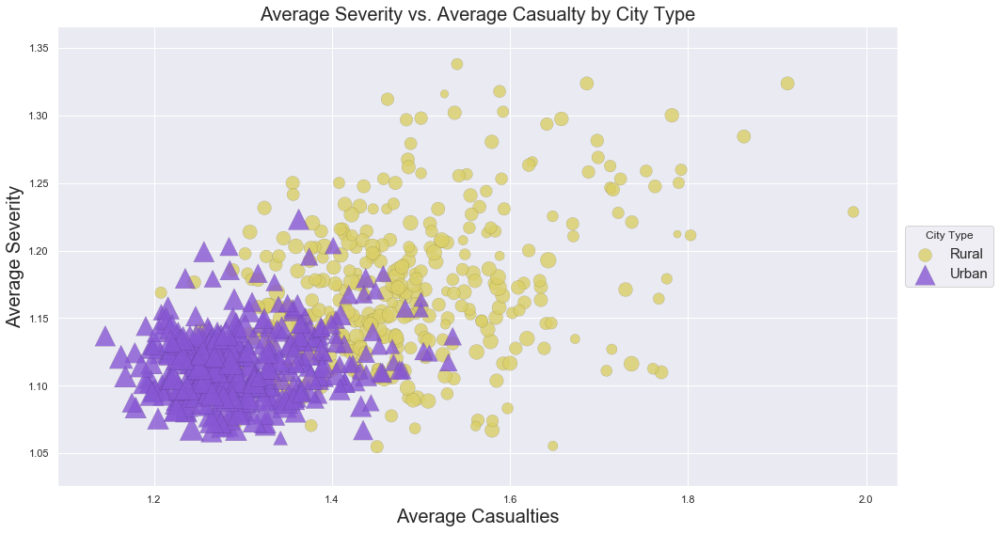

In [65]:
# Create dataframe
df_urban = df[df["Urban_or_Rural_Area"]=="Urban"]
df_rural = df[df["Urban_or_Rural_Area"]=="Rural"]

# Create needed stats
rural_mean_1 = df_rural.groupby(["Date"]).mean()["Accident_Severity"]
rural_mean_2 = df_rural.groupby(["Date"]).mean()["Number_of_Casualties"]
rural_count_3 = df_rural.groupby(["Date"]).count()["Accident_Index"]

urban_mean_1 = df_urban.groupby(["Date"]).mean()["Accident_Severity"]
urban_mean_2 = df_urban.groupby(["Date"]).mean()["Number_of_Casualties"]
urban_count_3 = df_urban.groupby(["Date"]).count()["Accident_Index"]

#Scatterplot 
plt.scatter(rural_mean_2,
            rural_mean_1,
            color="#DACF68",
            s=rural_count_3*2,
            edgecolor="black", linewidths= 0.1,
            alpha=0.8, label="Rural")

plt.scatter(urban_mean_2,
            urban_mean_1,
            color="#8757D4",
            s=urban_count_3*2,
            edgecolor="black", linewidths=0.1, marker="^", 
            alpha=0.8, label="Urban")

# Format Scatterplot
plt.title("Average Severity vs. Average Casualty by City Type", size=20)
plt.ylabel("Average Severity", size=20)
plt.xlabel("Average Casualties", size=20)
plt.legend(title='City Type', loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)

###  Accident Severity and Number of Vechiles

There seem to be a downward trend of average accident severity and number of vechiles

Text(0.5, 0, 'Average Number of Vechiles')

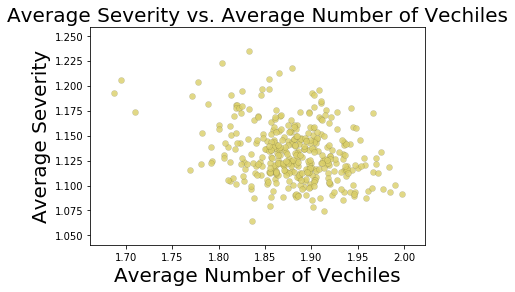

In [75]:
# Create needed stats
mean_1 = df.groupby(["Date"]).mean()["Accident_Severity"]
mean_2 = df.groupby(["Date"]).mean()["Number_of_Vehicles"]




#Scatterplot 
plt.scatter(mean_2,
            mean_1,
            color="#8757D4",
            edgecolor="black", linewidths= 0.1,
            alpha=0.8)


# Format Scatterplot
plt.title("Average Severity vs. Average Number of Vechiles", size=20)
plt.ylabel("Average Severity", size=20)
plt.xlabel("Average Number of Vechiles", size=20)

###  Accident Severity and Light Conditions

Light condition distribution are quite cardinal (which seem to be the like the case for a lot of our other categorical variable), furthermore we can observe that the distribution seem to follow for the different severity, so maybe light conditions may not be such an important variable to predicting accident severity

Text(0.5, 0, 'Count')

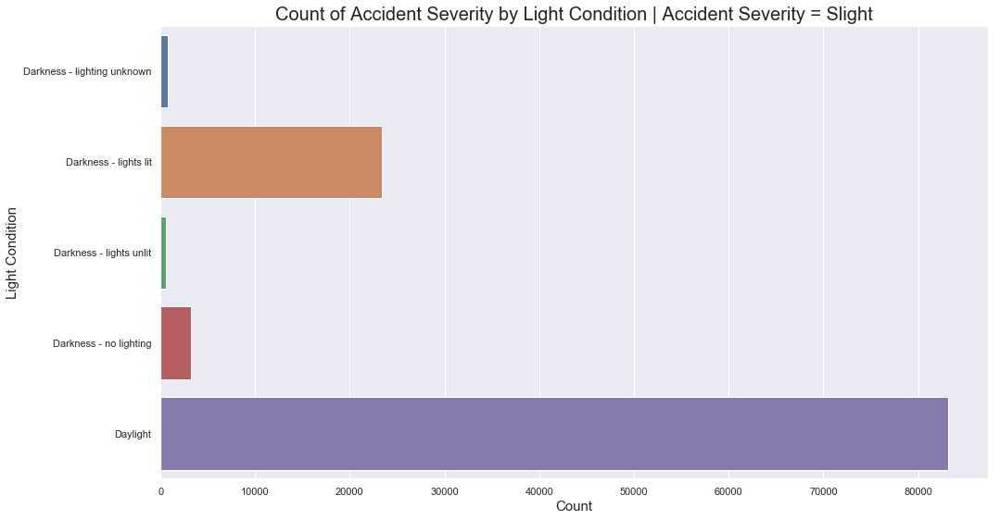

In [98]:
# Subsetting
df_light = df[['Light_Conditions','Accident_Severity']]
light_condition_severity_1 = df_light[df_light["Accident_Severity"]==1].groupby(by = 'Light_Conditions',as_index=False).count()

# Barplot
plt = sns.barplot(light_condition_severity_1['Accident_Severity'],light_condition_severity_1['Light_Conditions'])

# Formating Barplot
plt.set_title("Count of Accident Severity by Light Condition | Accident Severity = Slight", size=20)
plt.set_ylabel("Light Condition", size=15)
plt.set_xlabel("Count", size=15)

Text(0.5, 0, 'Count')

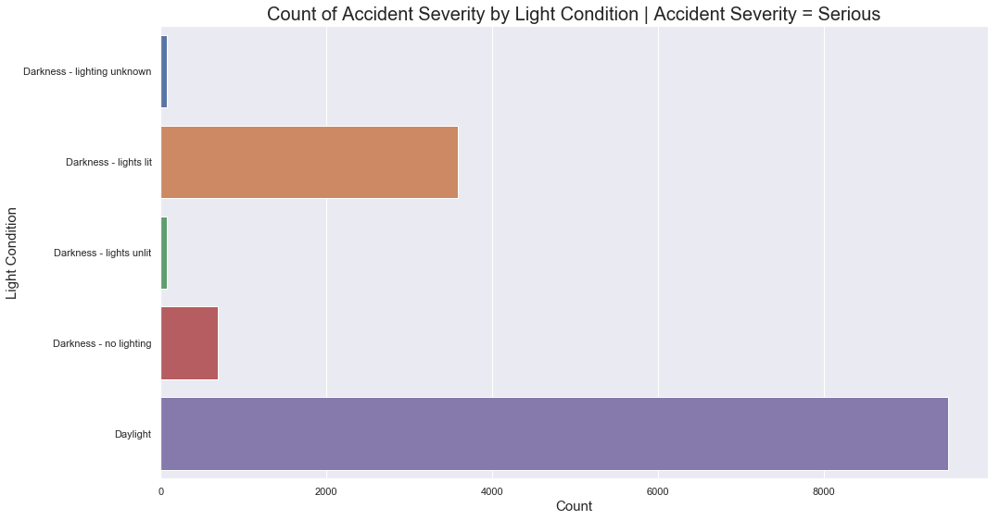

In [99]:
# Subsetting
df_light = df[['Light_Conditions','Accident_Severity']]
light_condition_severity_2 = df_light[df_light["Accident_Severity"]==2].groupby(by = 'Light_Conditions',as_index=False).count()

# Barplot
plt = sns.barplot(light_condition_severity_2['Accident_Severity'],light_condition_severity_2['Light_Conditions'])

# Formating Barplot
plt.set_title("Count of Accident Severity by Light Condition | Accident Severity = Serious", size=20)
plt.set_ylabel("Light Condition", size=15)
plt.set_xlabel("Count", size=15)

Text(0.5, 0, 'Count')

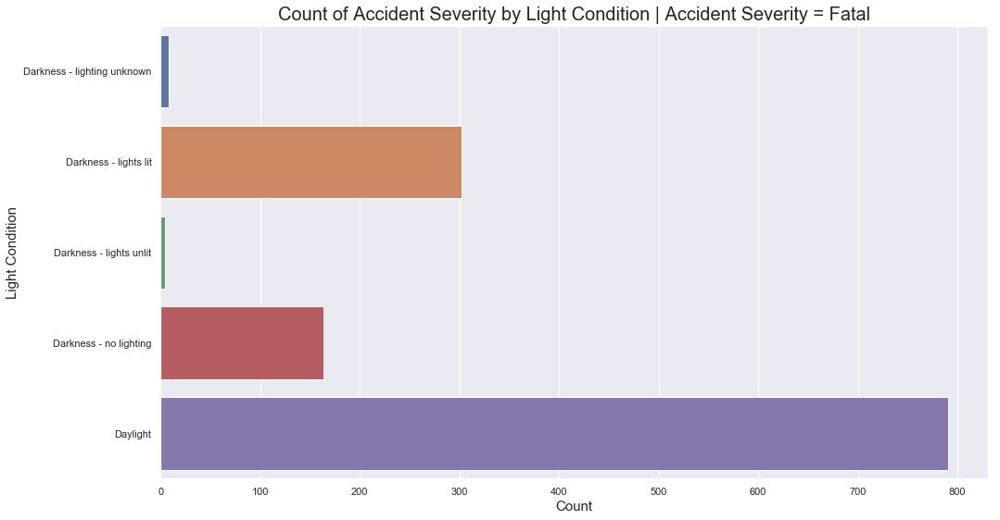

In [100]:
# Subsetting
df_light = df[['Light_Conditions','Accident_Severity']]
light_condition_severity_3 = df_light[df_light["Accident_Severity"]==3].groupby(by = 'Light_Conditions',as_index=False).count()

# Barplot
plt = sns.barplot(light_condition_severity_3['Accident_Severity'],light_condition_severity_3['Light_Conditions'])

# Formating Barplot
plt.set_title("Count of Accident Severity by Light Condition | Accident Severity = Fatal", size=20)
plt.set_ylabel("Light Condition", size=15)
plt.set_xlabel("Count", size=15)

### Accident Severity & Road Type

Text(0.5, 0, 'Count')

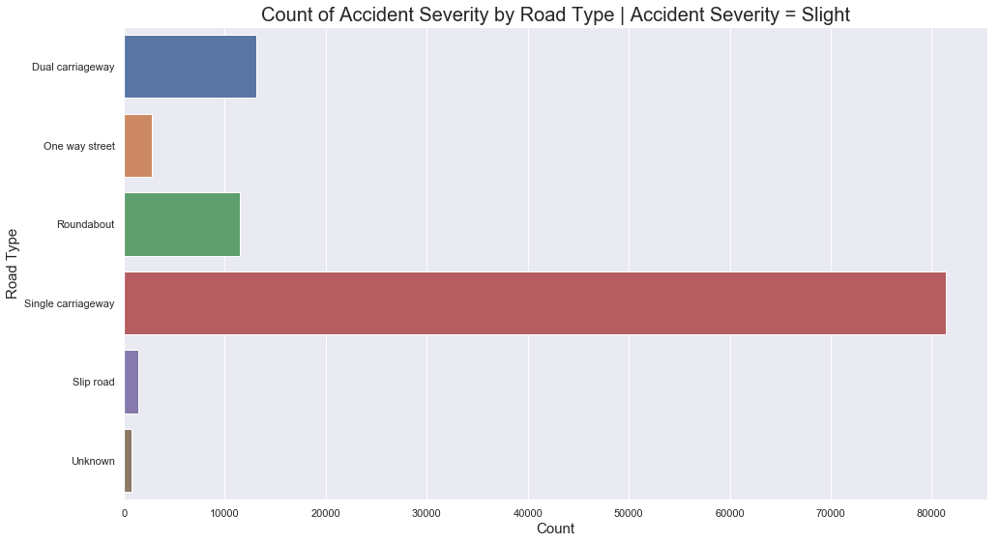

In [101]:
#Subsetting
df_roadtype = df[['Road_Type','Accident_Severity']]
road_type_severity = df_roadtype[df_roadtype["Accident_Severity"]==1].groupby(by = 'Road_Type',as_index=False).count()
#Barplot
plt = sns.barplot(road_type_severity['Accident_Severity'],road_type_severity['Road_Type'])
#Formating
plt.set_title("Count of Accident Severity by Road Type | Accident Severity = Slight", size=20)
plt.set_ylabel("Road Type", size=15)
plt.set_xlabel("Count", size=15)

Text(0.5, 0, 'Count')

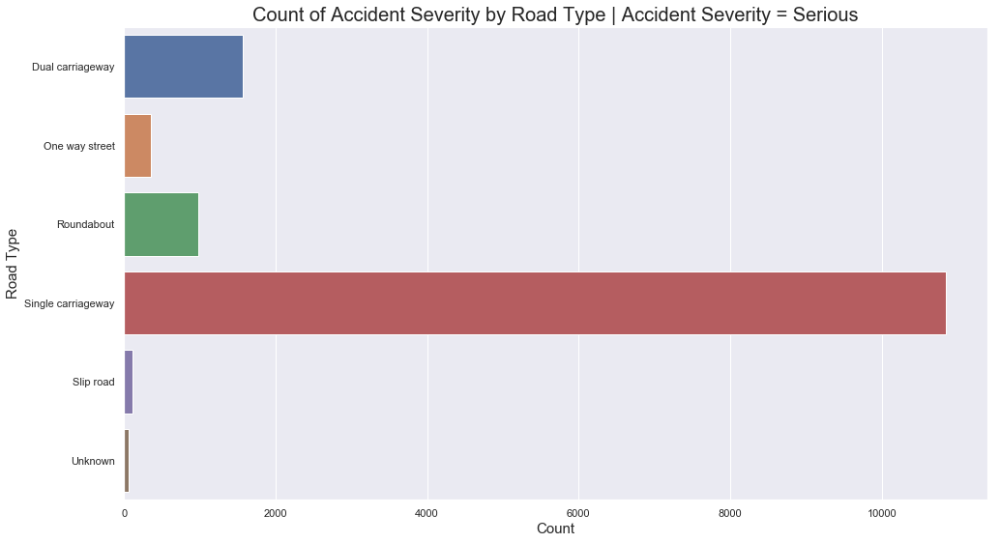

In [102]:
#Subsetting
df_roadtype = df[['Road_Type','Accident_Severity']]
road_type_severity = df_roadtype[df_roadtype["Accident_Severity"]==2].groupby(by = 'Road_Type',as_index=False).count()
#Barplot
plt = sns.barplot(road_type_severity['Accident_Severity'],road_type_severity['Road_Type'])
#Formating
plt.set_title("Count of Accident Severity by Road Type | Accident Severity = Serious", size=20)
plt.set_ylabel("Road Type", size=15)
plt.set_xlabel("Count", size=15)

Text(0.5, 0, 'Count')

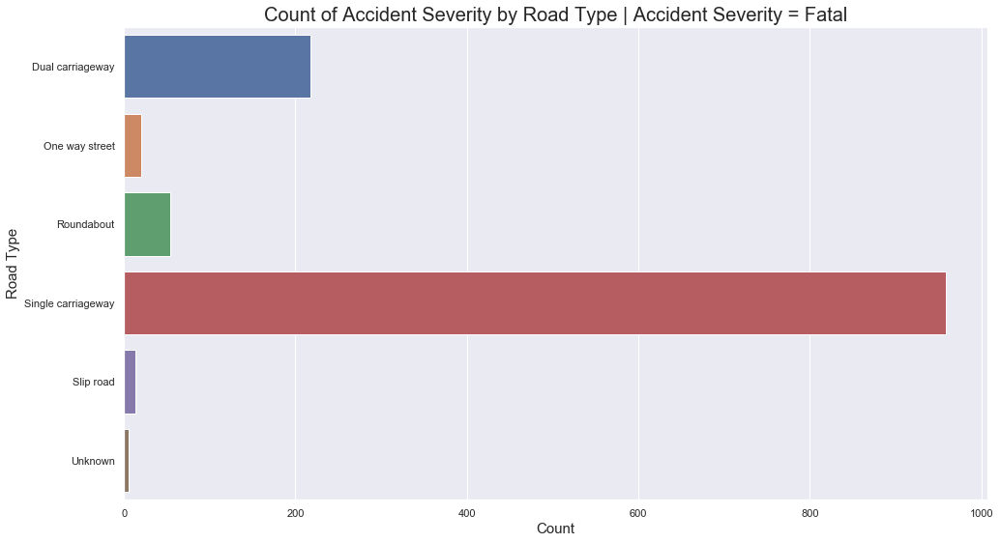

In [103]:
#Subsetting
df_roadtype = df[['Road_Type','Accident_Severity']]
road_type_severity = df_roadtype[df_roadtype["Accident_Severity"]==3].groupby(by = 'Road_Type',as_index=False).count()
#Barplot
plt = sns.barplot(road_type_severity['Accident_Severity'],road_type_severity['Road_Type'])
#Formating
plt.set_title("Count of Accident Severity by Road Type | Accident Severity = Fatal", size=20)
plt.set_ylabel("Road Type", size=15)
plt.set_xlabel("Count", size=15)

### Accident Severity & Weather Conditions

Text(0.5, 0, 'Count of Accident Severity')

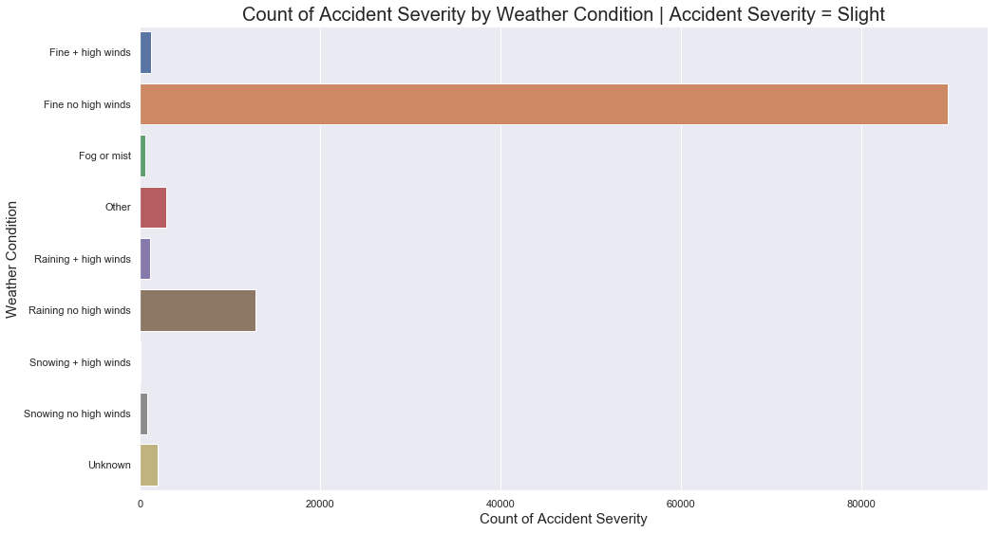

In [105]:
#Subsetting
df_weather = df[['Weather_Conditions','Accident_Severity']]
weather_severity = df_weather[df_weather["Accident_Severity"]==1].groupby(by = 'Weather_Conditions',as_index=False).count()
# Barplot
plt = sns.barplot(weather_severity['Accident_Severity'],weather_severity['Weather_Conditions'])
# Formating
plt.set_title("Count of Accident Severity by Weather Condition | Accident Severity = Slight", size=20)
plt.set_ylabel("Weather Condition", size=15)
plt.set_xlabel("Count of Accident Severity", size=15)

Text(0.5, 0, 'Count of Accident Severity')

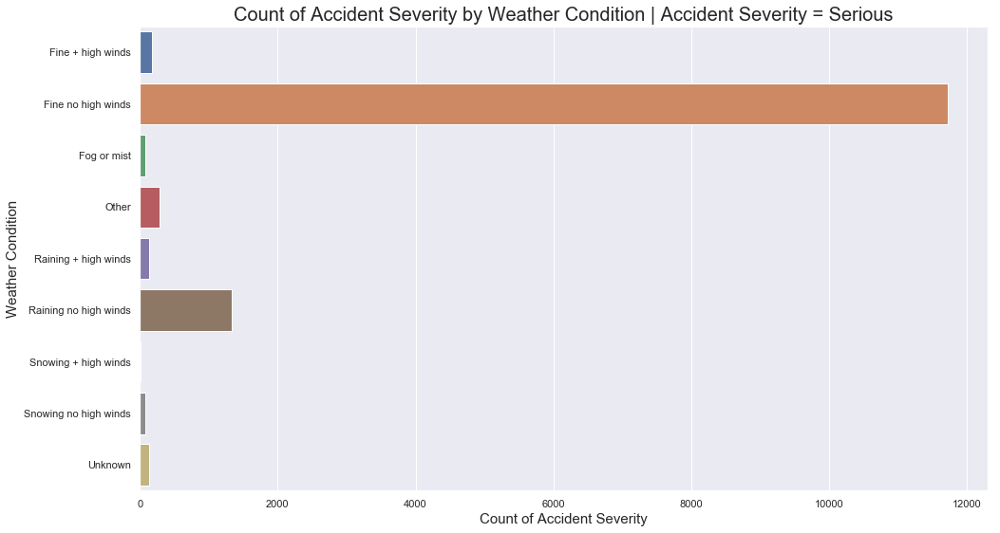

In [106]:
#Subsetting
df_weather = df[['Weather_Conditions','Accident_Severity']]
weather_severity = df_weather[df_weather["Accident_Severity"]==2].groupby(by = 'Weather_Conditions',as_index=False).count()
# Barplot
plt = sns.barplot(weather_severity['Accident_Severity'],weather_severity['Weather_Conditions'])
# Formating
plt.set_title("Count of Accident Severity by Weather Condition | Accident Severity = Serious", size=20)
plt.set_ylabel("Weather Condition", size=15)
plt.set_xlabel("Count of Accident Severity", size=15)

Text(0.5, 0, 'Count of Accident Severity')

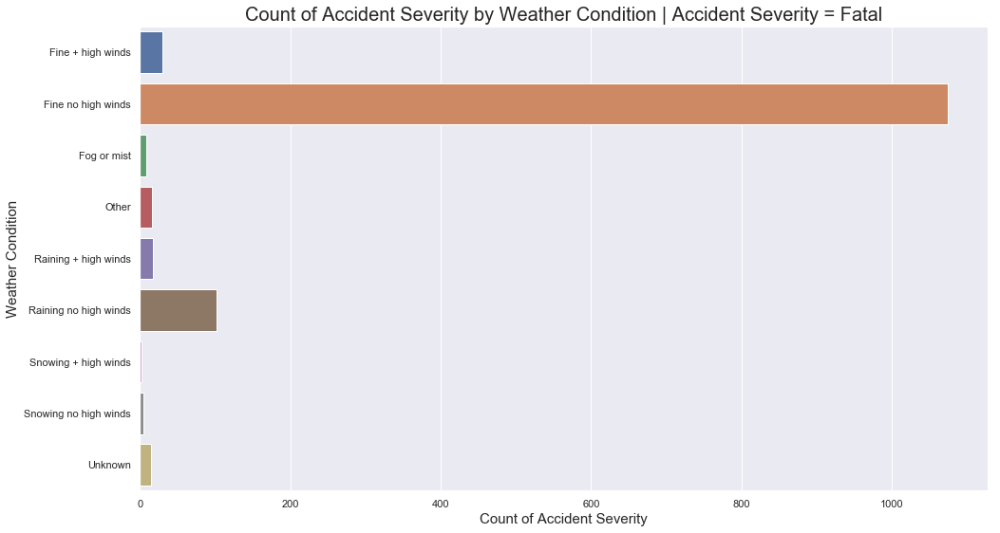

In [107]:
#Subsetting
df_weather = df[['Weather_Conditions','Accident_Severity']]
weather_severity = df_weather[df_weather["Accident_Severity"]==3].groupby(by = 'Weather_Conditions',as_index=False).count()
# Barplot
plt = sns.barplot(weather_severity['Accident_Severity'],weather_severity['Weather_Conditions'])
# Formating
plt.set_title("Count of Accident Severity by Weather Condition | Accident Severity = Fatal", size=20)
plt.set_ylabel("Weather Condition", size=15)
plt.set_xlabel("Count of Accident Severity", size=15)

 ## Model Building

In [5]:
# Data Preperation
list(df.columns.values)

df_model = df[["1st_Road_Class",
              "Month",
              "Day",
              "Day_of_Week",
              "Did_Police_Officer_Attend_Scene_of_Accident",
              "Junction_Control",
              "Light_Conditions",
              "Number_of_Vehicles",
              "Pedestrian_Crossing-Human_Control",
              "Pedestrian_Crossing-Physical_Facilities",
              "Road_Surface_Conditions",
              "Road_Type",
              "Special_Conditions_at_Site", 
              "Speed_limit", 
              "Urban_or_Rural_Area", 
              "Weather_Conditions",
              "Number_of_Casualties",
              "Accident_Severity"]]

df_model = pd.get_dummies(df_model, columns=["1st_Road_Class","Did_Police_Officer_Attend_Scene_of_Accident","Junction_Control","Pedestrian_Crossing-Human_Control","Pedestrian_Crossing-Physical_Facilities","Road_Surface_Conditions","Road_Type","Special_Conditions_at_Site","Urban_or_Rural_Area","Weather_Conditions","Light_Conditions","Day_of_Week"], drop_first=True)

df_model.head()

,Month,Day,Number_of_Vehicles,Speed_limit,Number_of_Casualties,Accident_Severity,1st_Road_Class_B,1st_Road_Class_C,1st_Road_Class_Motorway,1st_Road_Class_Unclassified,...,Light_Conditions_Darkness - lights lit,Light_Conditions_Darkness - lights unlit,Light_Conditions_Darkness - no lighting,Light_Conditions_Daylight,Day_of_Week_Monday,Day_of_Week_Saturday,Day_of_Week_Sunday,Day_of_Week_Thursday,Day_of_Week_Tuesday,Day_of_Week_Wednesday
1,1,5,1,30,1,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,1
6,1,13,2,30,1,1,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
8,1,15,2,30,2,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
9,1,15,2,30,5,1,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
10,1,16,1,30,1,1,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


In [6]:
# Drawing a small sample to run the analysis first to ensure that the code works
# 

y = df_model["Accident_Severity"]

del df_model["Accident_Severity"]
X = df_model.values

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.1, 
                            random_state=1995, stratify=y)

# TO deal with imbalanced dataset we use SMOTE (Synthetic Minority Over-sampling Technique)

smote = SMOTE("not majority")

X_train, y_train = smote.fit_sample(X_train, y_train)



# X_train = X_train[:3000]
# y_train = y_train[:3000]

# X_test  = X_test[3000:6001]
# y_test  = y_test[3000:6001]

In [7]:
# Confusion Matrix Plot
def plot_confusion_matrix(y_true, y_pred,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [8]:
# Ensemble Learning

class MajorityVoteClassifier(BaseEstimator, ClassifierMixin):
    ''' A majority vote ensemble classifier
    Params:
        classifiers : array-like, shape = [n_classifiers]
            Different classifiers fro the ensemble
        
        vote : str, {'classlabel', 'probability'}
            Default 'classlabel'
            If 'classlabel' the prediction is based on 
            the argmax of class labels. Else if 'probability',
            the argmax of the sum of probabilities is used to 
            predict the class label (recommended fro calibrated classifiers).
        
        weights : array-like, shape = [n_classifiers]
            Optional, default: None
            If a list of 'int' or 'float' values are provided,
            the classifiers are weighted by importance;
            Uses uniform weights if 'weights=None'.
        '''
    def __init__(self, classifiers,
                vote = 'classlabel', weights = None):
        self.classifiers = classifiers
        self.named_classifiers = {key: value for 
                                 key, value  in _name_estimators(classifiers)}
        self.vote = vote
        self.weights = weights
        
    def fit(self, X, y):
        ''' Fit classifiers.
        Params:
            X : {array-like, sparse matrix}, 
                shape = [n_samples, n_features]
                Matrix of training samples
            y : array-like, shape = [n_sample]
                Vector of target class labels.
        Returns
            self : Object
        '''
        # Use LabelEncoder to ensure class labels start with 0,
        # which is important for np.argmax, call in self.predict
        self.lablenc_ = LabelEncoder()
        self.lablenc_.fit(y)
        self.classes_ = self.lablenc_.classes_
        self.classifiers_ = []
        for clf in self.classifiers:
            fitted_clf = clone(clf).fit(X,
                                       self.lablenc_.transform(y))
            self.classifiers_.append(fitted_clf)
        return self
    
    def predict(self, X):
        ''' Predict class labels for X.
        Params
            X: {array-like, sparse matrix}
                Shape = [n_samples, n_features]
                Matrix of training samples.
        Returns
            maj_vote : array-like, shape = [n_sample]
                Predicted class labels.
        '''
        if self.vote == 'probability':
            maj_vote = np.argmax(self.predict_proba(X), 
                                axis = 1)
        else: # 'classlabel' vote
            # Collect results from clf.predict calls
            predictions = np.asarray([clf.predict(X)
                                     for clf in self.classifiers_]).T
            maj_vote = np.apply_along_axis(
                            lambda x:
                            np.argmax(np.bincount(x, weights=self.weights)),
                                      axis = 1,
                                      arr = predictions)
        maj_vote = self.lablenc_.inverse_transform(maj_vote)
        return maj_vote                            
        
    def predict_proba(self, X):
        ''' Predict class probabilities for X.
        Params:
            X : {array-like, sparse matrix}, 
                shape = [n_samples, n_features]
                Training vectors, where n_samples is 
                the number of samples and n_features is
                the number of features.
        Returns:
        avg_proba : array-like,
            shape = [n_samples, n_classes]
            Weighted average probability for 
            each class per sample.
        '''
        probas = np.asarray([clf.predict_proba(X)
                            for clf in self.classifiers_])
        avg_proba = np.average(probas,
                              axis = 0, weights = self.weights)
        return avg_proba

    def get_params(self, deep=True):
        ''' Get classifier parameters names for GridSearch'''
        if not deep:
            return super(MajorityVoteClassifier,
                        self).get_params(deep=False)
        else:
            out = self.named_classifiers.copy()
            for name, step in six.iteritems(self.named_classifiers):
                for key, value in six.iteritems(
                        step.get_params(deep = True)):
                    out['%s_%s' % (name, key)] = value
            return out

0.8807108769291452
Confusion matrix, without normalization
[[8829 2115  165]
 [1004  352   37]
 [  83   39    5]]


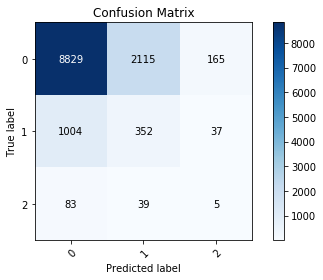

In [139]:
# Decision Tree
clf_dtree = DecisionTreeClassifier(random_state=0)
print(np.mean(cross_val_score(clf_dtree,X_train,y_train,cv=10)))

y_pred = clf_dtree.fit(X_train,y_train).predict(X_test)
plot_confusion_matrix(y_test,y_pred, title = "Confusion Matrix")

Confusion matrix, without normalization
[[7727 2444  938]
 [ 794  420  179]
 [  48   41   38]]


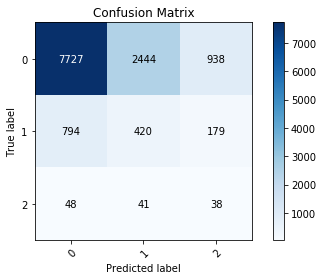

In [10]:
# Standardized data Decision Tree Analysis

p5  = Pipeline([('scl', StandardScaler()),('clf',DecisionTreeClassifier(max_features = "sqrt", min_samples_split=1000))])

y_pred = p5.fit(X_train,y_train).predict(X_test)
plot_confusion_matrix(y_test,y_pred, title = "Confusion Matrix")

# Shows better results

0.9009720763131653
Confusion matrix, without normalization
[[9473 1563   73]
 [1086  297   10]
 [  93   33    1]]


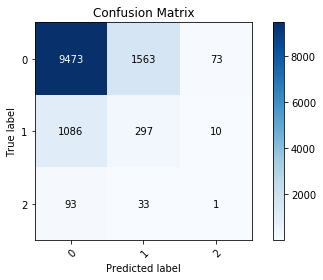

In [140]:
# Random Forest
clf_forest = RandomForestClassifier()
print(np.mean(cross_val_score(clf_forest,X_train,y_train,cv=10)))

y_pred = clf_forest.fit(X_train,y_train).predict(X_test)
plot_confusion_matrix(y_test,y_pred, title = "Confusion Matrix")

In [4]:
# Permutation Variable Importance - Not the default one

# This approach directly measures feature importance by observing how random re-shuffling (thus preserving the distribution of the variable) of each predictor influences model performance.
# Unlike the default does not tendency to inflate the importance of continuous features or high-cardinality categorical variables which we have

rf = RandomForestClassifier()

var_import = df[["1st_Road_Class",
              "Day_of_Week",
              "Did_Police_Officer_Attend_Scene_of_Accident",
              "Junction_Control",
              "Light_Conditions",
              "Number_of_Vehicles",
              "Pedestrian_Crossing-Human_Control",
              "Pedestrian_Crossing-Physical_Facilities",
              "Road_Surface_Conditions",
              "Road_Type",
              "Special_Conditions_at_Site", 
              "Speed_limit", 
              "Urban_or_Rural_Area", 
              "Weather_Conditions",
              "Number_of_Casualties"]]

var_import = pd.get_dummies(var_import, columns=["1st_Road_Class","Did_Police_Officer_Attend_Scene_of_Accident","Junction_Control","Pedestrian_Crossing-Human_Control","Pedestrian_Crossing-Physical_Facilities","Road_Surface_Conditions","Road_Type","Special_Conditions_at_Site","Urban_or_Rural_Area","Weather_Conditions","Light_Conditions","Day_of_Week"], drop_first=True)


def r2(rf, X_train, y_train):
    return r2_score(y_train, rf.predict(X_train))

perm_imp_rfpimp = permutation_importances(rf, var_import, df["Accident_Severity"], r2)

perm_imp_rfpimp

,Importance
Feature,
Number_of_Vehicles,0.508717
Number_of_Casualties,0.302100
Urban_or_Rural_Area_Urban,0.294273
Speed_limit,0.294273
Light_Conditions_Daylight,0.239488
Road_Type_Single carriageway,0.233227
Road_Surface_Conditions_Wet or damp,0.225401
1st_Road_Class_Unclassified,0.186269
Did_Police_Officer_Attend_Scene_of_Accident_2.0,0.175312


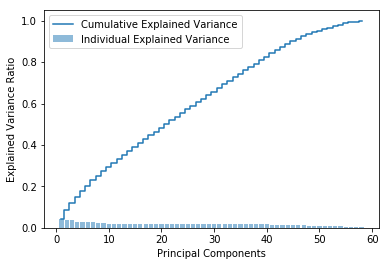

In [142]:
# PCA See whether if it is benefitual 
X_std = StandardScaler().fit_transform(X_train)
cov_mat = np.cov(X_std.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)
tot = sum(eigen_vals)
var_exp = [(i/tot) for i in sorted(eigen_vals, reverse = True)]
cum_var_exp = np.cumsum(var_exp)
plt.bar(range(1,len(var_exp)+1), var_exp, alpha = 0.5, align = 'center',
        label = 'Individual Explained Variance')
plt.step(range(1,len(var_exp)+1), cum_var_exp, where='mid',
        label = 'Cumulative Explained Variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc='best')

plt.show()

# Doesn't Seem Very Useful to conduct PCA

In [143]:
names = ["Perceptron",
         "LogisticRegression",
         "Decision Tree", 
         "Random Forest",           
         "Neural Net", 
         "Nearest Neighbors"] 

classifiers = [
    OneVsRestClassifier(Perceptron()),
    LogisticRegression(),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(),
    MLPClassifier(hidden_layer_sizes=(100,50), alpha=1),
    KNeighborsClassifier(5)]

for name, clf in zip(names, classifiers):
    pipe = Pipeline( [ ('scl', StandardScaler()),
                       ('clf', clf)])
    
    pipe.fit(X_train, y_train)
    score = pipe.score(X_test, y_test)
    score2 = cross_val_score(pipe,X,y,cv=10)
    print("Algo: {0:<20s} and 10 fold score: {1:0.4f}".format(name, np.mean(score2)))

Algo: Perceptron           and 10 fold score: 0.8216
Algo: LogisticRegression   and 10 fold score: 0.8795
Algo: Decision Tree        and 10 fold score: 0.8796
Algo: Random Forest        and 10 fold score: 0.8596
Algo: Neural Net           and 10 fold score: 0.8796
Algo: Nearest Neighbors    and 10 fold score: 0.8686


### Hyperparameter Searching


In [144]:
# Hyper Parameter Searching
def decision_tree_param_selection(X,y,nfold):
    clf_decision = DecisionTreeClassifier()
    pipe = Pipeline([("scl", StandardScaler()),
                     ("clf",clf_decision)])
    min_sample_splitss = [2,10,100,1000]
    max_featuress = ["auto","log2","sqrt"]
    param_grid = {"clf__min_samples_split":min_sample_splitss, "clf__max_features": max_featuress}
    grid_search = GridSearchCV(pipe, param_grid, cv=nfold)
    grid_search.fit(X, y)
    grid_search.best_params_
    return grid_search.best_params_

decision_tree_param_selection(X_train,y_train,10)

{'clf__max_features': 'sqrt', 'clf__min_samples_split': 2}

In [ ]:
def RandomForest_param_selection(X,y,nfold):
    clf_ = RandomForestClassifier()
    pipe = Pipeline([("scl", StandardScaler()),
                     ("clf",clf_)])
    n_estimatorss = [100,200,300]
    max_featuress = [1,2,3]
    param_grid = {'clf__n_estimators':n_estimatorss  ,'clf__max_features':max_featuress}
    grid_search = GridSearchCV(pipe, param_grid, cv=nfold)
    grid_search.fit(X, y)
    grid_search.best_params_
    return grid_search.best_params_

RandomForest_param_selection(X,y,10)

{'clf__max_features': 2, 'clf__n_estimators': 300}

In [6]:
def NN_param_selection(X,y,nfold):
    clf_nn = MLPClassifier(hidden_layer_sizes=(100,50),alpha=1)
    pipe = Pipeline([("scl", StandardScaler()),
                     ("clf",clf_nn)])
    alphas = [0.0001,.001,.01,.1,1,10]
    param_grid = {"clf__alpha": alphas}
    grid_search = GridSearchCV(pipe, param_grid, cv=nfold)
    grid_search.fit(X, y)
    grid_search.best_params_
    return grid_search.best_params_

NN_param_selection(X_train,y_train,10)

{'clf__alpha': 10}

In [7]:
def KNN_param_selection(X,y,nfold):
    clf_knn = KNeighborsClassifier(5)
    pipe = Pipeline([("scl", StandardScaler()),
                     ("clf",clf_knn)])
    n_neighbourss =[5,10,50,100]
    param_grid ={"clf__n_neighbors":n_neighbourss}
    grid_search = GridSearchCV(pipe, param_grid, cv=nfold)
    grid_search.fit(X, y)
    grid_search.best_params_
    return grid_search.best_params_

KNN_param_selection(X_train,y_train,10)

{'clf__n_neighbors': 50}

In [13]:
# Best Parameter Rerun
classifiers = [
    OneVsRestClassifier(Perceptron()),
    OneVsRestClassifier(LogisticRegression()),
    DecisionTreeClassifier(max_features = "sqrt", min_samples_split=1000),
    RandomForestClassifier(max_features = 3, n_estimators = 300),
    MLPClassifier(hidden_layer_sizes=(100,50), alpha=10),
    KNeighborsClassifier(50)]

for name, clf in zip(names, classifiers):
    pipe = Pipeline( [ ('scl', StandardScaler()),
                       ('clf', clf)])
    
    pipe.fit(X_train, y_train)
    score = pipe.score(X_test, y_test)
    score2 = cross_val_score(pipe,X,y,cv=10)
    print("Algo: {0:<20s} and 10 fold score: {1:0.4f}".format(name, np.mean(score2)))

Algo: Perceptron           and 10 fold score: 0.8216
Algo: LogisticRegression   and 10 fold score: 0.8795
Algo: Decision Tree        and 10 fold score: 0.8796
Algo: Random Forest        and 10 fold score: 0.8656
Algo: Neural Net           and 10 fold score: 0.8796
Algo: Nearest Neighbors    and 10 fold score: 0.8796


### Model Evaluation + Ensemble Learning Algo

[array([0.        , 0.14272208, 1.        ]), array([0.        , 0.07744731, 1.        ]), array([0.        , 0.08847745, 1.        ]), array([0.        , 0.06905653, 1.        ]), array([0.        , 0.07969273, 1.        ]), array([0.        , 0.08575931, 1.        ])]


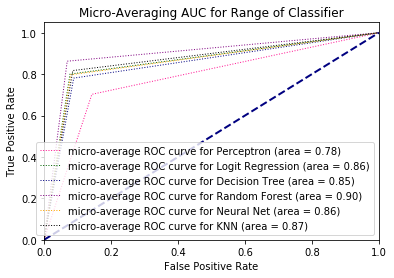

In [14]:
# ROC Curve + Learning Curve + Fitting Curve
# In order to do ROC micro averaging - we have to transform y into a binary classification
df_model2 = df[["1st_Road_Class",
              "Month",
              "Day",
              "Day_of_Week",
              "Did_Police_Officer_Attend_Scene_of_Accident",
              "Junction_Control",
              "Light_Conditions",
              "Number_of_Vehicles",
              "Pedestrian_Crossing-Human_Control",
              "Pedestrian_Crossing-Physical_Facilities",
              "Road_Surface_Conditions",
              "Road_Type",
              "Special_Conditions_at_Site", 
              "Speed_limit", 
              "Urban_or_Rural_Area", 
              "Weather_Conditions",
              "Number_of_Casualties",
              "Accident_Severity"]]

df_model2 = pd.get_dummies(df_model2, columns=["1st_Road_Class","Did_Police_Officer_Attend_Scene_of_Accident","Junction_Control","Pedestrian_Crossing-Human_Control","Pedestrian_Crossing-Physical_Facilities","Road_Surface_Conditions","Road_Type","Special_Conditions_at_Site","Urban_or_Rural_Area","Weather_Conditions","Light_Conditions","Day_of_Week"], drop_first=True)
y2 = df_model2["Accident_Severity"]
y2 = label_binarize(y2, classes=[0, 1, 2])

del df_model2["Accident_Severity"]
X2 = df_model2.values

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, 
                            test_size=0.1, 
                            random_state=1995, stratify=y)

# TO deal with imbalanced dataset we use SMOTE (Synthetic Minority Over-sampling Technique)
smote = SMOTE("minority")
X_train2, y_train2 = smote.fit_sample(X_train2, y_train2)


# X_train2 = X_train2[:3000]
# y_train2 = y_train2[:3000]

# X_test2  = X_test2[3000:6001]
# y_test2  = y_test2[3000:6001]

names = ["Perceptron",
         "LogisticRegression",
         "Decision Tree", 
         "Random Forest",           
         "Neural Net", 
         "Nearest Neighbors"] 

classifiers = [
    OneVsRestClassifier(Perceptron()),
    OneVsRestClassifier(LogisticRegression()),
    DecisionTreeClassifier(max_features = "sqrt", min_samples_split=1000),
    RandomForestClassifier(max_features = 3, n_estimators = 300),
    MLPClassifier(hidden_layer_sizes=(100,50), alpha=10),
    KNeighborsClassifier(50)]


roc_fpr = []
roc_tpr = []
roc_auc2 = []
n_classes = 3

for name, clf in zip(names, classifiers):
    pipe = Pipeline( [ ('scl', StandardScaler()),
                       ('clf', clf)])
    
    y_score = pipe.fit(X_train2,y_train2).predict(X_test2)   
     
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
       
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test2[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test2.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    roc_fpr.append(fpr["micro"])
    roc_tpr.append(tpr["micro"])
    roc_auc2.append(roc_auc["micro"])
       
print(roc_fpr)

plt.figure()
plt.plot(roc_fpr[0], roc_tpr[0],
         label='micro-average ROC curve for Perceptron (area = {0:0.2f})'
               ''.format(roc_auc2[0]),
         color='deeppink', linestyle=':', linewidth=1)
plt.plot(roc_fpr[1], roc_tpr[1],
         label='micro-average ROC curve for Logit Regression (area = {0:0.2f})'
               ''.format(roc_auc2[1]),
         color='darkgreen', linestyle=':', linewidth=1)
plt.plot(roc_fpr[2], roc_tpr[2],
         label='micro-average ROC curve for Decision Tree (area = {0:0.2f})'
               ''.format(roc_auc2[2]),
         color='navy', linestyle=':', linewidth=1)
plt.plot(roc_fpr[3], roc_tpr[3],
         label='micro-average ROC curve for Random Forest (area = {0:0.2f})'
               ''.format(roc_auc2[3]),
         color='purple', linestyle=':', linewidth=1)
plt.plot(roc_fpr[4], roc_tpr[4],
         label='micro-average ROC curve for Neural Net (area = {0:0.2f})'
               ''.format(roc_auc2[4]),
         color='orange', linestyle=':', linewidth=1)
plt.plot(roc_fpr[5], roc_tpr[5],
         label='micro-average ROC curve for KNN (area = {0:0.2f})'
               ''.format(roc_auc2[5]),
         color='black', linestyle=':', linewidth=1)


plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Averaging AUC for Range of Classifier')
plt.legend(loc="lower right")
plt.show()

In [8]:
# Ensemble Learning by Majority Voting
p1  = Pipeline([('scl', StandardScaler()),
                   ('clf', OneVsRestClassifier(Perceptron()))])
p2  = Pipeline([('scl', StandardScaler()),
                   ('clf', OneVsRestClassifier(LogisticRegression()))])
p3  = Pipeline([('scl', StandardScaler()),
                   ('clf', MLPClassifier(hidden_layer_sizes=(100,50), alpha=10))])
p4  = Pipeline([('scl', StandardScaler()),
                   ('clf', KNeighborsClassifier(50))])

p5  = Pipeline([('scl', StandardScaler()),('clf',DecisionTreeClassifier(max_features = "sqrt", min_samples_split=1000))])

p6  = Pipeline([('scl', StandardScaler()),('clf',RandomForestClassifier(max_features = 3, n_estimators = 300))])

ensemble = MajorityVoteClassifier(classifiers = [p1,p2,p3,p4,p5,p6])

names = [ "Ensemble Learning"] 

classifiers = [ensemble]


for name, clf in zip(names, classifiers):
    scores = cross_val_score(estimator = clf,
                            X = X_train,
                            y = y_train,
                            cv = 5)
     
    print('Score: %.2f (+/- %.2f) [%s]' % (scores.mean(), scores.std(), name))

Score: 0.88 (+/- 0.00) [Ensemble Learning]


Confusion matrix, without normalization
[[9503 1421  185]
 [1064  283   46]
 [  87   29   11]]


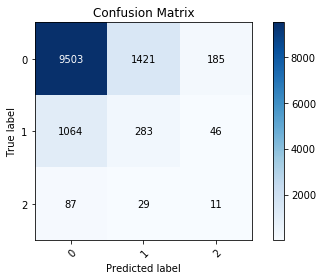

In [14]:
# Ensemble Learning Confusion matrix

y_pred = ensemble.fit(X_train,y_train).predict(X_test)
plot_confusion_matrix(y_test,y_pred, title = "Confusion Matrix")

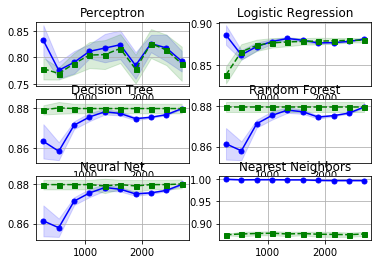

In [10]:
# Learning Curve
train_mean_ = []
train_std_  = []
test_mean_  = []
test_std_  = []
train_sizes_ = []

names = ["Perceptron",
         "LogisticRegression",
         "Decision Tree", 
         "Random Forest",           
         "Neural Net", 
         "Nearest Neighbors"] 

classifiers = [p1,p2,p3,p4,p5,p6]

for name, clf in zip(names, classifiers):
    train_sizes, train_scores, test_scores = learning_curve(estimator = clf,
                                                           X = X_train,
                                                           y = y_train,
                                                           train_sizes = np.linspace(0.1, 1.0, 10), # 10 evenly spaced intervals 
                                                           cv = 10,
                                                           n_jobs = 1)
    train_mean = np.mean(train_scores, axis = 1)
    train_std  = np.std(train_scores, axis = 1)
    test_mean  = np.mean(test_scores, axis = 1)
    test_std  = np.std(test_scores, axis = 1)

    train_mean_.append(train_mean)
    train_std_.append(train_std)
    test_mean_.append(test_mean)
    test_std_.append(test_std)
    train_sizes_.append(train_sizes)
    
    
plt.subplot(3, 2, 1)
plt.plot(train_sizes_[0], train_mean_[0], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[0] + train_std_[0], 
                              train_mean_[0] - train_std_[0],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[0], test_mean_[0], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[0] + test_std_[0], 
                              test_mean_[0] - test_std_[0],
                              alpha = 0.15, color = 'green')
plt.title('Perceptron')
plt.grid()

plt.subplot(3, 2, 2)
plt.plot(train_sizes_[1], train_mean_[1], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[1] + train_std_[1], 
                              train_mean_[1] - train_std_[1],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[1], test_mean_[1], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[1] + test_std_[1], 
                              test_mean_[1] - test_std_[1],
                              alpha = 0.15, color = 'green')

plt.title("Logistic Regression")
plt.grid()

plt.subplot(3, 2, 3)
plt.plot(train_sizes_[2], train_mean_[2], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[2] + train_std_[2], 
                              train_mean_[2] - train_std_[2],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[2], test_mean_[2], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[2] + test_std_[2], 
                              test_mean_[2] - test_std_[2],
                              alpha = 0.15, color = 'green')

plt.title("Decision Tree")
plt.grid()

plt.subplot(3, 2, 4)
plt.plot(train_sizes_[3], train_mean_[3], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[3] + train_std_[3], 
                              train_mean_[3] - train_std_[3],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[3], test_mean_[3], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[3] + test_std_[3], 
                              test_mean_[3] - test_std_[3],
                              alpha = 0.15, color = 'green')

plt.title("Random Forest")
plt.grid()

plt.subplot(3, 2, 5)
plt.plot(train_sizes_[4], train_mean_[4], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[4] + train_std_[4], 
                              train_mean_[4] - train_std_[4],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[4], test_mean_[4], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[4] + test_std_[4], 
                              test_mean_[4] - test_std_[4],
                              alpha = 0.15, color = 'green')

plt.title("Neural Net")
plt.grid()


plt.subplot(3, 2, 6)
plt.plot(train_sizes_[5], train_mean_[5], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[5] + train_std_[5], 
                              train_mean_[5] - train_std_[5],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[5], test_mean_[5], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[5] + test_std_[5], 
                              test_mean_[5] - test_std_[5],
                              alpha = 0.15, color = 'green')

plt.title("Nearest Neighbors")
plt.grid()



(0.7, 1.0)

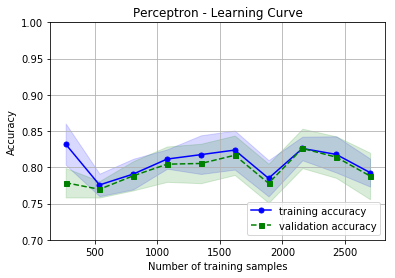

In [17]:
plt.plot(train_sizes_[0], train_mean_[0], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[0] + train_std_[0], 
                              train_mean_[0] - train_std_[0],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[0], test_mean_[0], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[0] + test_std_[0], 
                              test_mean_[0] - test_std_[0],
                              alpha = 0.15, color = 'green')

plt.grid()
plt.title('Perceptron - Learning Curve')
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

(0.7, 1.0)

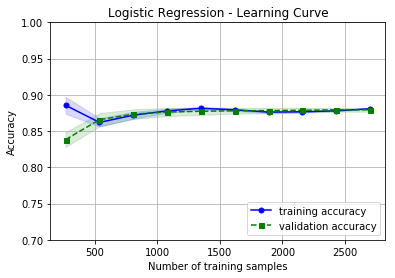

In [18]:
plt.plot(train_sizes_[1], train_mean_[1], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[1] + train_std_[1], 
                              train_mean_[1] - train_std_[1],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[1], test_mean_[1], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[1] + test_std_[1], 
                              test_mean_[1] - test_std_[1],
                              alpha = 0.15, color = 'green')

plt.title("Logistic Regression - Learning Curve")

plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

(0.7, 1.0)

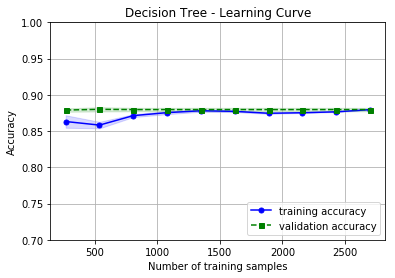

In [19]:
plt.plot(train_sizes_[2], train_mean_[2], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[2] + train_std_[2], 
                              train_mean_[2] - train_std_[2],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[2], test_mean_[2], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[2] + test_std_[2], 
                              test_mean_[2] - test_std_[2],
                              alpha = 0.15, color = 'green')

plt.title("Decision Tree - Learning Curve")
plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

(0.7, 1.0)

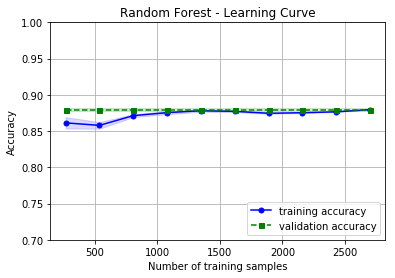

In [20]:
plt.plot(train_sizes_[3], train_mean_[3], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[3] + train_std_[3], 
                              train_mean_[3] - train_std_[3],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[3], test_mean_[3], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[3] + test_std_[3], 
                              test_mean_[3] - test_std_[3],
                              alpha = 0.15, color = 'green')

plt.title("Random Forest - Learning Curve")
plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

(0.7, 1.0)

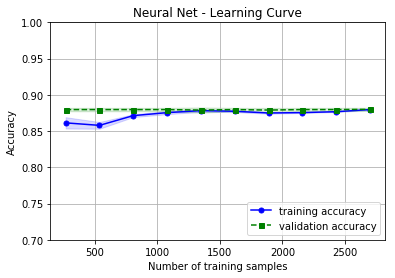

In [21]:
plt.plot(train_sizes_[4], train_mean_[4], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[4] + train_std_[4], 
                              train_mean_[4] - train_std_[4],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[4], test_mean_[4], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[4] + test_std_[4], 
                              test_mean_[4] - test_std_[4],
                              alpha = 0.15, color = 'green')

plt.title("Neural Net - Learning Curve")
plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

(0.7, 1.0)

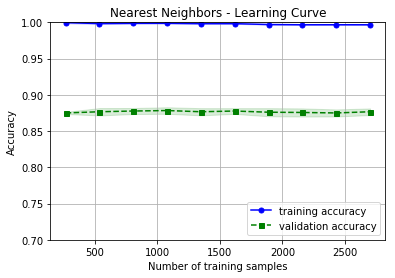

In [22]:
plt.plot(train_sizes_[5], train_mean_[5], 
         color = 'blue', marker = 'o', 
         markersize = 5, 
         label = 'training accuracy')
plt.fill_between(train_sizes, train_mean_[5] + train_std_[5], 
                              train_mean_[5] - train_std_[5],
                              alpha = 0.15, color = 'blue')

plt.plot(train_sizes_[5], test_mean_[5], 
         color = 'green', linestyle = '--',  
         marker = 's', markersize = 5, 
         label = 'validation accuracy')
plt.fill_between(train_sizes, test_mean_[5] + test_std_[5], 
                              test_mean_[5] - test_std_[5],
                              alpha = 0.15, color = 'green')

plt.title("Nearest Neighbors - Learning Curve")
plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc = 'lower right')
plt.ylim([0.7, 1.0])

## Implications and Improvements 

From our model building and analysis, we are able to observe that our ensemble model is able to give the highest accuracy score when it comes to our multi-classification problem. Thus, we would recommend insurance company to use this ensemble model to predict the accident severity for future data.

### Implications

Going back to our introduction, we mentioned that the objective of this project is to explore the potential of machine learning in insurance industry. Thus, how can we use our model in a insurance setting? By being able to predict the accident severity from the data given when a person file for an insurance claim (combining with police report and such), insurance company would be able to predict whether an accident should be classified as slight, serious, or fatal and this could change the amount/rate of the compensation.

Another area that this model maybe directly used is to claim fraud. As when people file for accident claims, they may often exaggerate some parts, and thus it is useful for insurance company to be able to use the data and see whether the model aggrees, and if not may warrant for the insurance company to conduct further investigation as the claim maybe fraudulent and thus may potentially help insurance company save money.

### Improvements
Though our model has shown a high score, it doesn't mean that there are issue that it faces. From our confusion matrix table, we are able to see that the model often have difficulty classifying serious accidents. This mainly arrises from the issue of highly skewed dataset, as out of the 12K usable data, only around 1K of the data are fatal accidents. Even with SMOTE resampling techniques it only slightly improve the situation and modelling. Furthermore currently, we can see that our dataset requires all data to be completed in order to be used, though in reality this is not the case as a lot of information may tend to not avaliable or wrong. We thus should be able to build a model with weighting of information (+ class weights which would further help with the skewed data problem). However, these feature engineering often requires domain knowledge. 

Another potential extension, is that currently, we are only looking at 2005 data. It would be interesting to explore how our model may change over time, as accident prone zone and reason why accident becomes fatal may change over time.
